If you need Python, please download here: https://www.python.org/downloads/

Quick survey to test our current level of knowledge: https://s.surveyplanet.com/fiio1hdc

For those who have no knowledge of Python or will like to learn: https://www.python.org/about/gettingstarted/

For the labs you may use Google colab, Jupyter Notebooks or LTU's free GPU Kubernetes Cluster: https://www.ltu.se/research/subjects/Maskininlarning/Kubernetes-Cluster?l=en

References:
1. NLTK: https://www.nltk.org/book/ch01.html
2. spaCy: https://spacy.io/usage/spacy-101

At the end of the Lab, students should be able to
1. Do tokenization & text preprocessing
2. Visualize a vector space in low dimension

Python data types (e.g. int, str, set, list, float ...)

In [1]:
# Explicitly typecast 2 ints as float and display their sum
sum = float(3) + float(34)
print('The sum of {0} and {1} is {2}'.format(3, 34, sum))

The sum of 3 and 34 is 37.0


Loops

In [20]:
##### Learn some valuable lessons through mistakes here ....

n=4 # no of cases
a=[]  # list/array type

for i in range(0,n):
    elem=int(input("Enter mark: ")) # inefficient input/output approach...more efficient to read from a file.
    a.append(elem)
# NOTE - this does not compute average (avg=sum(a)/n) even though the variable name suggests this!
# Variable names can be arbitrarily defined but1 it's best to use a name that relates to the logic you want.

avg = a[1] + a[2]  # This actually adds the 2nd element to the 3rd, because Python uses zero-based counting.
print("2nd + 3rd, 0th item, 1st item,...", avg, a[0], a[1], a[2], a[3]) # adding a[4] gives an out of index error - again because Python is zero-based.

print("Sum of 2nd & 3rd marks in the list", round(avg, 2))  # if we had float values then the round to 2 will work clearly.

Enter mark: 4
Enter mark: 1
Enter mark: 9
Enter mark: 5
2nd + 3rd, 0th item, 1st item,... 10 4 1 9 5
Sum of 2nd & 3rd marks in the list 10


Loop to remove duplicates from list (Pandas library has a special function for this when dealing with data)

In [21]:
a = [10,20,30,20,10,50,60,40,80,50,40]
dup_items = set()
uniq_items = []

for x in a:                         # List comprehension is a more efficient way to do something similar
    if x not in dup_items:
        uniq_items.append(x)
        dup_items.add(x)

print(dup_items)
print(uniq_items)

{40, 10, 80, 50, 20, 60, 30}
[10, 20, 30, 50, 60, 40, 80]


Conditional statements

In [22]:
n=6
c=0
odds, even = [], []
elem = [3,7,6,77,21,10]

for i in range(0,n):
   if elem[i]%2 == 1:
       odds.append(elem[i])
       c+=1
   elif elem[i]%2 == 0:
      even.append(elem[i])

print(odds)
print(even)

[3, 7, 77, 21]
[6, 10]


Functions

In [24]:
# Double all numbers in a list

def double_list(numbers):
    new_n = []
    for x in numbers:
      new_n.append(2 * x)

    return new_n

res = double_list([-1, 4, -3, 1, 5, 2, -8, -2, 0])
print(res)

[-2, 8, -6, 2, 10, 4, -16, -4, 0]


Import modules/libraries

In [25]:
import datetime

now = datetime.datetime.now()
print ("Current date and time : ", now.strftime("%Y-%m-%d %H:%M:%S"))
print('--------------------')

# Some maths
from math import pi

r = 2.4
a = pi * r**2
print ("The area of the circle" + " is: " + str(a))   # what will happen if we did not typecast a?

Current date and time :  2023-11-14 11:00:36
--------------------
The area of the circle is: 18.09557368467721


Tokenization with NLTK

In [29]:
import nltk # Natural language toolkit
nltk.download('punkt')                                              # use this to download the punkt resource once
data = "Sommaren är bäst i Sverige när bäst är först"
tokens = nltk.word_tokenize(data)
fd = nltk.FreqDist(tokens)
print(tokens)
print(fd)
print(fd.most_common(3))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\cleme\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


['Sommaren', 'är', 'bäst', 'i', 'Sverige', 'när', 'bäst', 'är', 'först']
<FreqDist with 7 samples and 9 outcomes>
[('är', 2), ('bäst', 2), ('Sommaren', 1)]


Text Preprocessing with the Pandas library

In [27]:
import pandas as pd

def preprocess_pandas(data):
    data['Sentence'] = data['Sentence'].str.lower()                                                                     # make all lowercase
    data['Sentence'] = data['Sentence'].replace('[a-zA-Z0-9-_.]+@[a-zA-Z0-9-_.]+', '', regex=True)                      # remove emails
    data['Sentence'] = data['Sentence'].replace('((25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)(\.|$)){4}', '', regex=True)    # remove IP address
    data['Sentence'] = data['Sentence'].str.replace('[^\w\s]','')                                                       # remove special characters
    data['Sentence'] = data['Sentence'].replace('\d', '', regex=True)                                                   # remove numbers
    return data

lst = ['Det är mycket bra att laga mat','Swenglish is fun to speak! :)']
df = pd.DataFrame (lst, columns = ['Sentence'])
data = preprocess_pandas(df)
print(data)

                         Sentence
0  det är mycket bra att laga mat
1      swenglish is fun to speak 


<ipython-input-27-d5462313e718>:7: FutureWarning: The default value of regex will change from True to False in a future version.
  data['Sentence'] = data['Sentence'].str.replace('[^\w\s]','')                                                       # remove special characters


Task 1

1. Implement tokenization using the spaCy library instead of the NLTK library.
2. Implement part of speech (PoS) tagging using spaCy or NLTK for the first 500 samples in the training set of the IMDB data. Link to data: https://www.kaggle.com/datasets/lakshmi25npathi/imdb-dataset-of-50k-movie-reviews
3. Visualize the first 20 samples in the IMDB training data using PCA, t-SNE or any other low-dimensionality algorithm.

In [1]:
#1. Implement tokenization using the spaCy library instead of the NLTK library

import spacy

nlp = spacy.load("en_core_web_sm")
doc = nlp("This is a decomposition test with spacy ! It's so nice to be Henri's friend")
for token in doc:
    print(token.text, token.pos_, token.dep_)



This PRON nsubj
is AUX ROOT
a DET det
decomposition NOUN compound
test NOUN attr
with ADP prep
spacy NOUN pobj
! PUNCT punct
It PRON nsubj
's AUX ROOT
so ADV advmod
nice ADJ acomp
to PART aux
be AUX xcomp
Henri PROPN poss
's PART case
friend NOUN attr


In [10]:
import spacy
import pandas as pd

# Replace 'your_file.csv' with the actual name of your CSV file
file_path = 'IMDB dataset.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Select the first 500 rows
first_500_rows = df.head(500)
nlp = spacy.load("en_core_web_sm")

# Now, first_500_rows contains the first 500 rows of your CSV data
for rows in first_500_rows['review']:
    doc = nlp(rows)
    for token in doc:
        print(token.text, token.pos_)

One NUM
of ADP
the DET
other ADJ
reviewers NOUN
has AUX
mentioned VERB
that SCONJ
after ADP
watching VERB
just ADV
1 NUM
Oz NOUN
episode NOUN
you PRON
'll AUX
be AUX
hooked VERB
. PUNCT
They PRON
are AUX
right ADJ
, PUNCT
as SCONJ
this PRON
is AUX
exactly ADV
what PRON
happened VERB
with ADP
me.<br PROPN
/><br PUNCT
/>The PRON
first ADJ
thing NOUN
that PRON
struck VERB
me PRON
about ADP
Oz PROPN
was AUX
its PRON
brutality NOUN
and CCONJ
unflinching VERB
scenes NOUN
of ADP
violence NOUN
, PUNCT
which PRON
set VERB
in ADP
right NOUN
from ADP
the DET
word NOUN
GO PROPN
. PUNCT
Trust VERB
me PRON
, PUNCT
this PRON
is AUX
not PART
a DET
show NOUN
for ADP
the DET
faint ADJ
hearted ADJ
or CCONJ
timid ADJ
. PUNCT
This DET
show NOUN
pulls VERB
no DET
punches NOUN
with ADP
regards NOUN
to ADP
drugs NOUN
, PUNCT
sex NOUN
or CCONJ
violence NOUN
. PUNCT
Its PRON
is AUX
hardcore ADJ
, PUNCT
in ADP
the DET
classic ADJ
use NOUN
of ADP
the DET
word.<br NOUN
/><br PUNCT
/>It NOUN
is AUX
called VERB
OZ P

[array([-1.4282993e+00,  5.6523865e-01, -4.6020836e-01,  5.5111277e-01,
        1.4271576e+00, -6.0947382e-01,  7.8204006e-02,  1.8411645e-01,
       -7.0276362e-01, -3.2845247e-01,  8.3949363e-01,  5.5619121e-01,
       -6.8185437e-01,  1.3508238e+00, -6.4730692e-01,  2.1043493e-01,
       -8.1798577e-01, -1.9829264e-01, -9.9855512e-01, -2.4884343e-02,
       -1.8536124e+00,  1.0000992e+00,  1.9852831e+00, -4.7389528e-01,
        4.2209837e-01, -3.1573847e-01,  2.8643364e-01,  4.5188996e-01,
        5.2420348e-01, -1.0356562e+00, -3.9098769e-02, -6.5554845e-01,
        8.6282384e-01, -4.3630525e-03, -1.0262611e+00,  1.1343204e+00,
       -8.3423471e-01,  7.4906427e-01,  4.7415334e-01,  1.9156288e+00,
       -4.3543589e-01, -4.3292844e-01, -6.0441452e-01,  5.3843439e-01,
       -1.0551460e+00,  1.9197217e-01, -4.2213854e-01,  1.8795712e+00,
       -8.4672332e-02, -2.6000440e-03, -1.2208441e+00, -2.1909374e-01,
        1.1516970e-01, -1.4083343e+00,  8.7660658e-01, -6.5858239e-01,
     

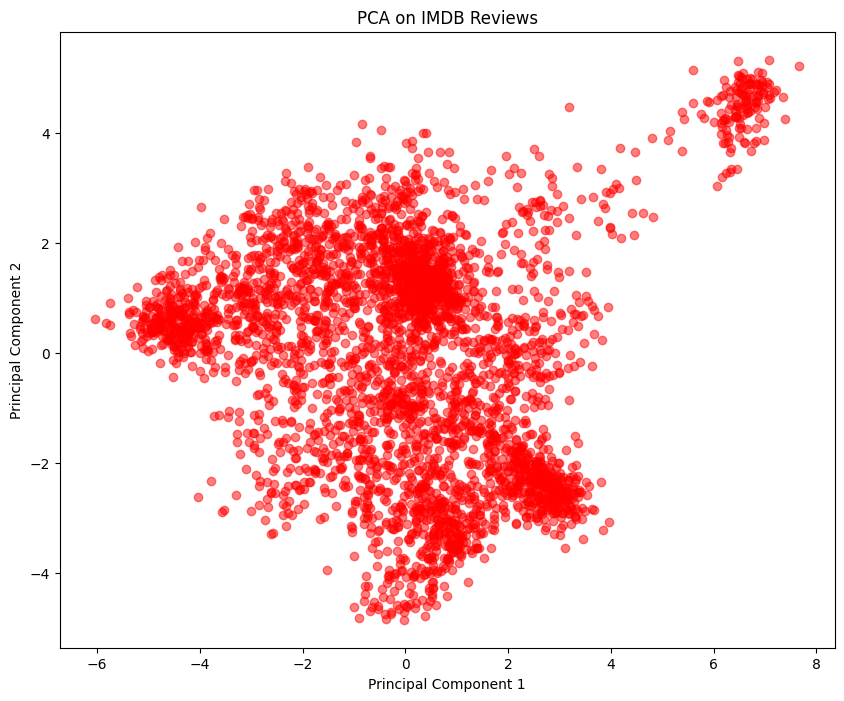

In [20]:
import numpy as np 
from sklearn.decomposition import PCA
import spacy
import pandas as pd
import matplotlib.pyplot as plt

# Replace 'your_file.csv' with the actual name of your CSV file
file_path = 'IMDB dataset.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Select the first 500 rows
first_500_rows = df.head(20)
nlp = spacy.load("en_core_web_sm")

vector_list=[]
# Now, first_500_rows contains the first 500 rows of your CSV data
for rows in first_500_rows['review']:
    doc = nlp(rows)
    for token in doc:
        vector_list.append(token.vector)

print(vector_list)
pca = PCA(n_components=2,svd_solver="full")
pca.fit(vector_list)
pca_result = pca.transform(vector_list)
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5, color = 'red')
plt.title('PCA on IMDB Reviews')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()



Grading questions (in addition to any relevant ones not listed below):

1. Run or show your code outcome, go through it and explain what it does.
2. Is there any part of the code that may be optimized (made better)
3. What other challenges can this solution be adapted for?
4. Will you like to discuss the time & space complexities of parts of your solution (optional)?